<h1><center> Projet Machine Learning avec Python : </center></h1>
<h1><center> Prédiction des incidents  à San Francisco </center></h1>


<center> ALLARD Lucas, HEDFI Houeida et MEFENZA NOUNTU Thierry
 

<h1><center> Partie 1 : Opérations préliminaires sur la base et visualisation des données <center></h1>

**Packages**

In [26]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(11, 4)})

# 1. Opérations préliminaires sur la base de données

**1.1. Lecture du CSV**

In [27]:
path = 'C:/Users/Allard/Desktop/Projet_Call_SF' # Change to path to data
os.chdir(path)

In [28]:
df = pd.read_csv('Fire_Department_Calls_for_Service.csv')

C:\Users\Allard\anaconda3\envs\geopandas\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (19,20,25,30,34,39) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [29]:
df.columns

Index(['Call Number', 'Unit ID', 'Incident Number', 'Call Type', 'Call Date',
       'Watch Date', 'Received DtTm', 'Entry DtTm', 'Dispatch DtTm',
       'Response DtTm', 'On Scene DtTm', 'Transport DtTm', 'Hospital DtTm',
       'Call Final Disposition', 'Available DtTm', 'Address', 'City',
       'Zipcode of Incident', 'Battalion', 'Station Area', 'Box',
       'Original Priority', 'Priority', 'Final Priority', 'ALS Unit',
       'Call Type Group', 'Number of Alarms', 'Unit Type',
       'Unit sequence in call dispatch', 'Fire Prevention District',
       'Supervisor District', 'Neighborhooods - Analysis Boundaries',
       'Location', 'RowID', 'shape', 'Supervisor Districts',
       'Fire Prevention Districts', 'Current Police Districts',
       'Neighborhoods - Analysis Boundaries', 'Zip Codes',
       'Neighborhoods (old)', 'Police Districts',
       'Civic Center Harm Reduction Project Boundary', 'HSOC Zones',
       'Central Market/Tenderloin Boundary Polygon - Updated', 'Neighb

In [30]:
df.count()

Call Number                                             5459482
Unit ID                                                 5459482
Incident Number                                         5459482
Call Type                                               5459482
Call Date                                               5459482
Watch Date                                              5459482
Received DtTm                                           5459482
Entry DtTm                                              5459482
Dispatch DtTm                                           5459482
Response DtTm                                           5039441
On Scene DtTm                                           4233284
Transport DtTm                                          1440191
Hospital DtTm                                           1304525
Call Final Disposition                                  5459482
Available DtTm                                          5382474
Address                                 

**1.2. Suppression des colonnes inutiles**

Toutes les colonnes suivantes ne sont pas utiles pour notre objectif de prédire le nombre d'appels qui aura lieu à une heure et un quartier précis

In [31]:
df1 = df.drop(columns=['Call Number', 'Unit ID', 'Incident Number',
       'Watch Date', 'Entry DtTm', 'Dispatch DtTm',
       'Response DtTm', 'On Scene DtTm', 'Transport DtTm', 'Hospital DtTm',
       'Call Final Disposition', 'Available DtTm', 'City',
       'Original Priority', 'Priority', 'ALS Unit',
       'Number of Alarms', 'Unit Type',
       'Unit sequence in call dispatch', 'Fire Prevention District',
       'Supervisor District', 'RowID', 'Supervisor Districts',
       'Fire Prevention Districts', 'Current Police Districts', 'Zip Codes',
       'Neighborhoods (old)', 'Police Districts',
       'Civic Center Harm Reduction Project Boundary', 'HSOC Zones',
       'Central Market/Tenderloin Boundary Polygon - Updated', 'Neighborhoods',
       'SF Find Neighborhoods', 'Current Police Districts 2',
       'Current Supervisor Districts'])

In [32]:
df1.count()

Call Type                               5459482
Call Date                               5459482
Received DtTm                           5459482
Address                                 5459482
Zipcode of Incident                     5445068
Battalion                               5459482
Station Area                            5457126
Box                                     5459029
Final Priority                          5459482
Call Type Group                         2647716
Neighborhooods - Analysis Boundaries    5459482
Location                                5459482
shape                                   5361010
Neighborhoods - Analysis Boundaries     5344884
dtype: int64

In [33]:
df1.columns

Index(['Call Type', 'Call Date', 'Received DtTm', 'Address',
       'Zipcode of Incident', 'Battalion', 'Station Area', 'Box',
       'Final Priority', 'Call Type Group',
       'Neighborhooods - Analysis Boundaries', 'Location', 'shape',
       'Neighborhoods - Analysis Boundaries'],
      dtype='object')

**1.3. Transformation du format des dates en datetime + extraction de l'année, mois, jour, heure, minute et du jour de semaine**

In [34]:
# ----- prend plusieurs minutes -----
#on transforme la colonne en type DateTime pour utiliser la colonne comme une date 
df1['Received DtTm'] = pd.to_datetime(df1['Received DtTm'], infer_datetime_format=True)
df1['Call Date'] = pd.to_datetime(df1['Call Date'], infer_datetime_format=True)

In [35]:
df2 = df1.copy()

df2['year'] = df2['Received DtTm'].dt.year
df2['month'] = df2['Received DtTm'].dt.month
df2['day'] = df2['Received DtTm'].dt.day
df2['hour'] = df2['Received DtTm'].dt.hour
df2['minute'] = df2['Received DtTm'].dt.minute
df2["weekday"] = df2['Received DtTm'].dt.day_name()

In [36]:
df2.columns

Index(['Call Type', 'Call Date', 'Received DtTm', 'Address',
       'Zipcode of Incident', 'Battalion', 'Station Area', 'Box',
       'Final Priority', 'Call Type Group',
       'Neighborhooods - Analysis Boundaries', 'Location', 'shape',
       'Neighborhoods - Analysis Boundaries', 'year', 'month', 'day', 'hour',
       'minute', 'weekday'],
      dtype='object')

Nous trions par date exacte à laquelle nous recevons chaque appel

In [37]:
df2.sort_values(by='Received DtTm', inplace=True)

In [38]:
df3 = df2.copy()

**1.4. Suppressions de tous les doublons : c'est à dire les appels à quelques minutes d'intervalle pour un même incident**

En effet, plusieurs appels peuvent avoir lieu pour un même incident à quelques minutes d'intervalles, ainsi nous prenons le soin de supprimer tous les appels qui ont lieu dans le même quartier, dans la même tranche horaire et pour le même type d'incident en suppoant que c'est des doublons

In [39]:
df3 = df3.drop_duplicates(subset=['Call Type', 'Call Date', 'Address',
       'Zipcode of Incident', 'Battalion', 'Final Priority', 'Call Type Group',
       'Neighborhooods - Analysis Boundaries', 'Location', 'year', 'month', 'day', 'hour', 'weekday'], keep='first')

**1.5. On ne conserve uniquement les appels à partir du 1er janvier 2012 ainsi que les appels où toutes les données sont renseignées**

Beaucoup de données sont manquantes avant le 1er janvier 2012. Ainsi nous restreignons notre base de données du 1er janvier 2012 minuit au 31 décembre 2020 23h59. Nous verrons par la suite que pour l'utilisation de modèle de Machine Learning cette base est relativement conséquente et nous restreindrons à quelques années. 

In [40]:
df4 = df3.copy()

In [41]:
df4 = df4[(df4['Received DtTm'] > '2012-01-01') & (df4['Received DtTm'] < '2021-01-01')]

**1.6. Création d'une variable pour la catégorie des appels qui est un mélange entre la variable "Call Type" (très détaillé) et la variable "Call Type Group" (peu détaillé)**

Nous avons 2 variables qui catégorisent les incidents:
    -"Call Type" qui recense énormément de types différents d'appels (+ de 30)
    -"Call Type Group" qui est plus concis avec seulement 4 variables (mais des données manquantes)
Nous avons donc reconstitué notre propre variable "Call Category" qui est composé de seulement 6 types d'appels:
    -"Medical Non Life-Threatening"
    -"Medical Potentially Life-Threatening"
    -"Fire"
    -"Alarms"
    -"Other"
    -"Incidents"

In [42]:
df4.loc[(df4["Call Type"] == "Medical Incident") & (df4["Call Type Group"] == "Non Life-threatening"), "Call Category"] = "Medical Non Life-Threatening"

df4.loc[(df4["Call Type"] == "Medical Incident") & (df4["Call Type Group"] == "Potentially Life-Threatening"), "Call Category"] = "Medical Potentially Life-Threatening"

df4.loc[df4["Call Type"] == "Outside Fire", "Call Category"] = "Fire"
df4.loc[df4["Call Type"] == "Structure Fire", "Call Category"] = "Fire"
df4.loc[df4["Call Type"] == "Vehicle Fire", "Call Category"] = "Fire"
df4.loc[df4["Call Type"] == "Marine Fire", "Call Category"] = "Fire"
df4.loc[df4["Call Type"] == "Train / Rail Fire", "Call Category"] = "Fire"
df4.loc[df4["Call Type"] == "Explosion", "Call Category"] = "Fire"

df4.loc[df4["Call Type"] == "Alarms", "Call Category"] = "Alarms"
df4.loc[(df4["Call Type"] == "Medical Incident") & (df4["Call Type Group"] == "Alarm"), "Call Category"] = "Alarms"

df4.loc[df4["Call Type"] == "Other", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Administrative", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Smoke Investigation (Outside)", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Odor (Strange / Unknown)", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Watercraft in Distress", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Confined Space / Structure Collapse", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Extrication / Entrapped (Machinery, Vehicle)", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Aircraft Emergency", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Suspicious Package", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Citizen Assist / Service Call", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Assist Police", "Call Category"] = "Other"
df4.loc[df4["Call Type"] == "Mutual Aid / Assist Outside Agency", "Call Category"] = "Other"

df4.loc[df4["Call Type"] == "Electrical Hazard", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Gas Leak (Natural and LP Gases)", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Fuel Spill", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "HazMat", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Oil Spill", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Industrial Accidents", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Train / Rail Incident", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Traffic Collision", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "High Angle Rescue", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Water Rescue", "Call Category"] = "Incidents"
df4.loc[df4["Call Type"] == "Elevator / Escalator Rescue", "Call Category"] = "Incidents"

In [43]:
df4["Call Category"].unique()

array(['Medical Non Life-Threatening', 'Fire',
       'Medical Potentially Life-Threatening', 'Incidents', 'Other',
       'Alarms', nan], dtype=object)

**1.7. Suppression des colonnes qui ne servent plus**

In [44]:
df4.drop(columns=["Call Type","Call Type Group"], inplace=True)

In [45]:
df4.count()

Call Date                               1227726
Received DtTm                           1227726
Address                                 1227726
Zipcode of Incident                     1224663
Battalion                               1227726
Station Area                            1226615
Box                                     1227649
Final Priority                          1227726
Neighborhooods - Analysis Boundaries    1227726
Location                                1227726
shape                                   1182755
Neighborhoods - Analysis Boundaries     1179441
year                                    1227726
month                                   1227726
day                                     1227726
hour                                    1227726
minute                                  1227726
weekday                                 1227726
Call Category                           1223520
dtype: int64

**1.8. Suppressions de tous les appels pour lesquels il manque au moins une donnée**

In [46]:
df4.dropna(inplace=True)

In [47]:
df4.count()

Call Date                               1175862
Received DtTm                           1175862
Address                                 1175862
Zipcode of Incident                     1175862
Battalion                               1175862
Station Area                            1175862
Box                                     1175862
Final Priority                          1175862
Neighborhooods - Analysis Boundaries    1175862
Location                                1175862
shape                                   1175862
Neighborhoods - Analysis Boundaries     1175862
year                                    1175862
month                                   1175862
day                                     1175862
hour                                    1175862
minute                                  1175862
weekday                                 1175862
Call Category                           1175862
dtype: int64

In [48]:
df4.head()

,Call Date,Received DtTm,Address,Zipcode of Incident,Battalion,Station Area,Box,Final Priority,Neighborhooods - Analysis Boundaries,Location,shape,Neighborhoods - Analysis Boundaries,year,month,day,hour,minute,weekday,Call Category
2949367,2012-01-01,2012-01-01 00:00:57,0 Block of WASHINGTON ST,94111.0,B01,13,1116,2,Financial District/South Beach,"(37.796450111202, -122.396164646182)",POINT (-122.396164646182 37.796450111202),8.0,2012,1,1,0,0,Sunday,Medical Non Life-Threatening
2920610,2012-01-01,2012-01-01 00:02:05,GEARY BL/CLEARY CT,94109.0,B04,3,3323,2,Western Addition,"(37.785061737122, -122.42643012773)",POINT (-122.42643012773 37.785061737122),39.0,2012,1,1,0,2,Sunday,Medical Non Life-Threatening
3003150,2012-01-01,2012-01-01 00:02:27,HAIGHT ST/LAGUNA ST,94102.0,B02,36,3415,3,Hayes Valley,"(37.772734311086, -122.425512056036)",POINT (-122.425512056036 37.772734311086),9.0,2012,1,1,0,2,Sunday,Fire
2990241,2012-01-01,2012-01-01 00:02:53,WALLER ST/LAGUNA ST,94102.0,B02,36,3415,3,Hayes Valley,"(37.771795346154, -122.425322486842)",POINT (-122.425322486842 37.771795346154),9.0,2012,1,1,0,2,Sunday,Fire
3002275,2012-01-01,2012-01-01 00:03:55,1100 Block of FOLSOM ST,94103.0,B02,29,2322,3,South of Market,"(37.775260329348, -122.409820946894)",POINT (-122.409820946894 37.775260329348),34.0,2012,1,1,0,3,Sunday,Medical Potentially Life-Threatening


In [ ]:
# Importation de notre nouvelle base de données que nous utiliserons dans les parties 2 et 3
df4.to_csv('Fire_Department_Calls_for_Service_reduced_V3.csv')

# 2.1. Visualisation des données temporelles

**Nombre d'appels par catégorie**

In [49]:
df4["Call Category"].unique()

array(['Medical Non Life-Threatening', 'Fire',
       'Medical Potentially Life-Threatening', 'Incidents', 'Other',
       'Alarms'], dtype=object)

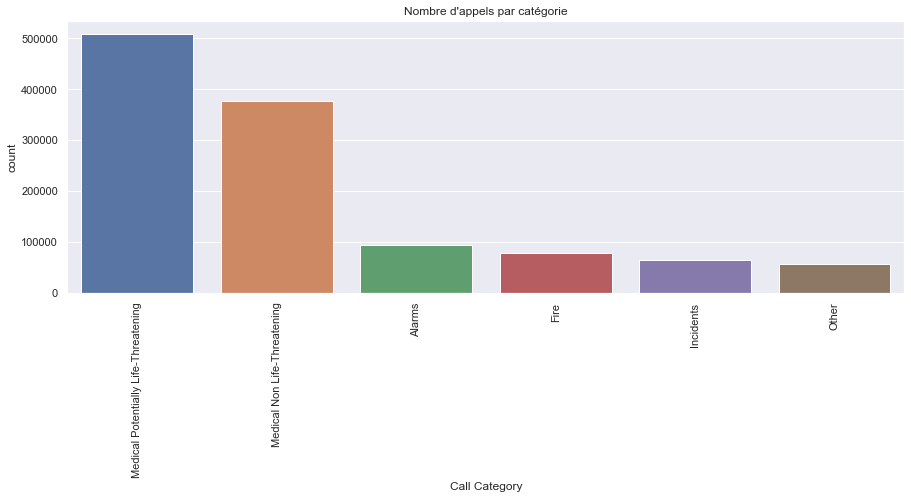

In [50]:
plt.figure(figsize=(15,5))
sns.countplot(x='Call Category', data=df4, 
              order = df4['Call Category'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Nombre d'appels par catégorie")
plt.show()

**Lineplot de la catégorie Medical Non Life-Threatening par mois (par étapes)**

In [51]:
def donnees2(nom):
    return df4.loc[df4["Call Category"] == nom]

In [52]:
dataMNLT = donnees2("Medical Non Life-Threatening")
dataMNLT.head(5)

,Call Date,Received DtTm,Address,Zipcode of Incident,Battalion,Station Area,Box,Final Priority,Neighborhooods - Analysis Boundaries,Location,shape,Neighborhoods - Analysis Boundaries,year,month,day,hour,minute,weekday,Call Category
2949367,2012-01-01,2012-01-01 00:00:57,0 Block of WASHINGTON ST,94111.0,B01,13,1116,2,Financial District/South Beach,"(37.796450111202, -122.396164646182)",POINT (-122.396164646182 37.796450111202),8.0,2012,1,1,0,0,Sunday,Medical Non Life-Threatening
2920610,2012-01-01,2012-01-01 00:02:05,GEARY BL/CLEARY CT,94109.0,B04,3,3323,2,Western Addition,"(37.785061737122, -122.42643012773)",POINT (-122.42643012773 37.785061737122),39.0,2012,1,1,0,2,Sunday,Medical Non Life-Threatening
2933160,2012-01-01,2012-01-01 00:10:24,3RD ST/MARKET ST,94103.0,B01,1,1241,2,Financial District/South Beach,"(37.787641847607, -122.403430803415)",POINT (-122.403430803415 37.787641847607),8.0,2012,1,1,0,10,Sunday,Medical Non Life-Threatening
2990728,2012-01-01,2012-01-01 00:17:16,1100 Block of FILLMORE ST,94115.0,B05,5,3535,2,Western Addition,"(37.780021494942, -122.432114423941)",POINT (-122.432114423941 37.780021494942),39.0,2012,1,1,0,17,Sunday,Medical Non Life-Threatening
2967994,2012-01-01,2012-01-01 00:18:23,500 Block of BARNEVELD AVE,94124.0,B10,9,6427,2,Bayview Hunters Point,"(37.74044593571, -122.404296869791)",POINT (-122.404296869791 37.74044593571),1.0,2012,1,1,0,18,Sunday,Medical Non Life-Threatening


In [53]:
r = pd.DataFrame(dataMNLT["month"].value_counts())
r

,month
8,33133
3,32988
1,32961
5,32833
7,32545
6,31882
4,31711
2,30213
12,30181
10,29914


In [54]:
r["Mois"] = r.index
r.columns = ["Effectif", "Mois"]
r

,Effectif,Mois
8,33133,8
3,32988,3
1,32961,1
5,32833,5
7,32545,7
6,31882,6
4,31711,4
2,30213,2
12,30181,12
10,29914,10


Text(0.5, 1.0, 'Medical Non Life-Threatening')

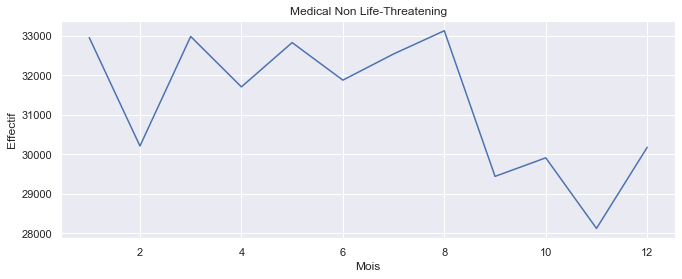

In [55]:
sns.lineplot(data = r, x = "Mois", y = "Effectif").set_title('Medical Non Life-Threatening')

**Lineplot de la catégorie Medical Potentially Life-Threatening par mois**

Text(0.5, 1.0, 'Medical Potentially Life-Threatening')

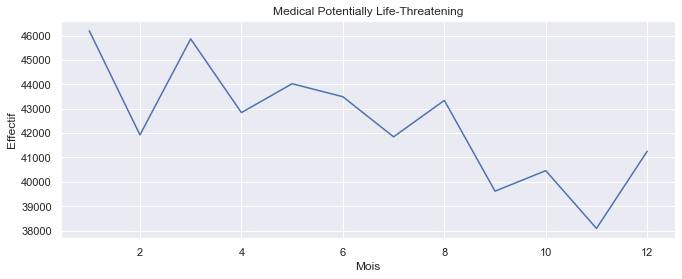

In [56]:
dataMPLT = donnees2("Medical Potentially Life-Threatening")
rh = pd.DataFrame(dataMPLT["month"].value_counts())
rh["Mois"] = rh.index
rh.columns = ["Effectif", "Mois"]
sns.lineplot(data = rh, x = "Mois", y = "Effectif").set_title('Medical Potentially Life-Threatening')

**Lineplots de chaque Call Category par année**

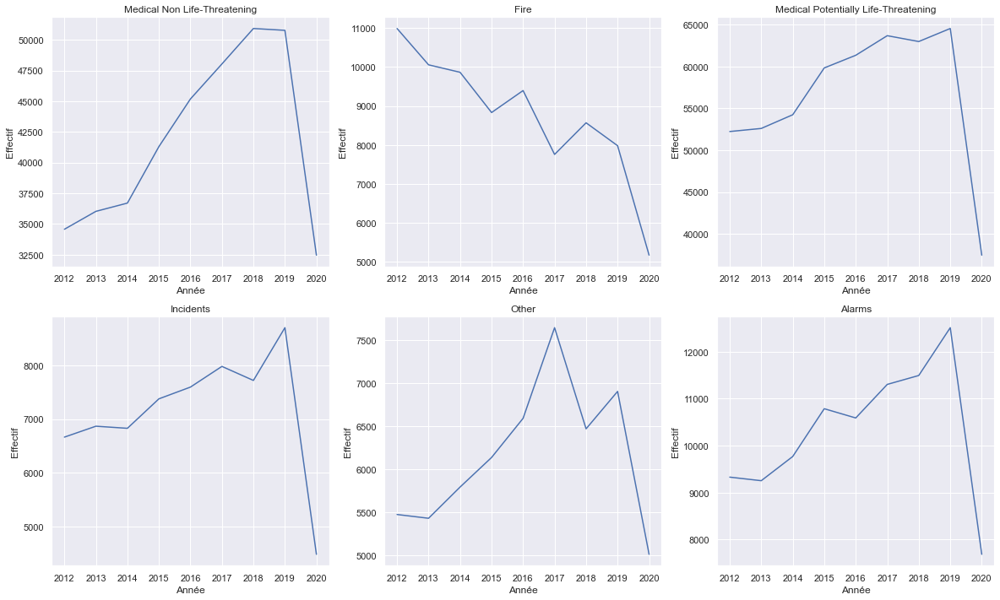

In [57]:
fig = plt.figure(figsize=(20,25))
for i,nom in enumerate(df4["Call Category"].unique(), 0):
    datamed = donnees2(nom)
    raa = pd.DataFrame(datamed["year"].value_counts())
    raa["Année"] = raa.index
    raa.columns = ["Effectif", "Année"]
    ax = fig.add_subplot(4, 3, i+1)
    sns.lineplot(data = raa, x = "Année", y = "Effectif", ax = ax)    
    ax.set_title(nom)

**Lineplots de chaque Call Category par mois**

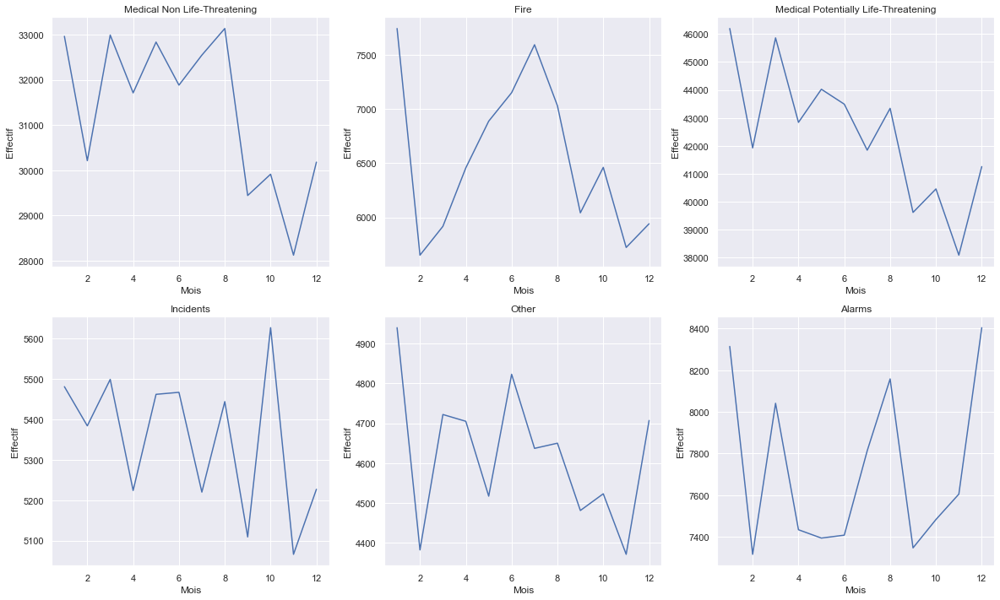

In [58]:
fig = plt.figure(figsize=(20,25))
for i,nom in enumerate(df4["Call Category"].unique(), 0):
    datamed = donnees2(nom)
    rr = pd.DataFrame(datamed["month"].value_counts())
    rr["Mois"] = rr.index
    rr.columns = ["Effectif", "Mois"]
    ax = fig.add_subplot(4, 3, i+1)
    sns.lineplot(data = rr, x = "Mois", y = "Effectif", ax = ax)    
    ax.set_title(nom)

**Lineplots de chaque Call Category par jour du mois**

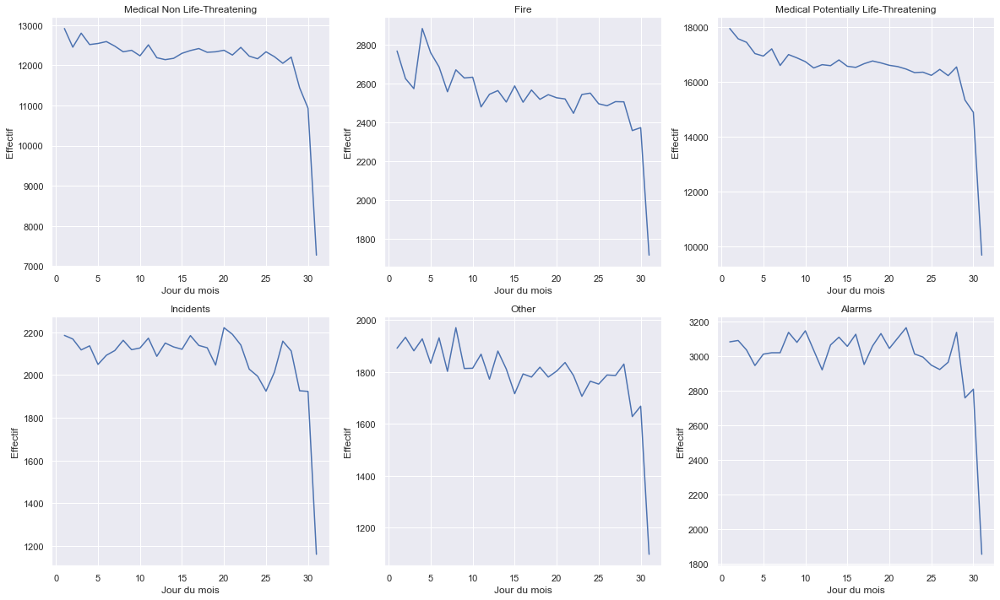

In [59]:
fig = plt.figure(figsize=(20,25))
for i,nom in enumerate(df4["Call Category"].unique(), 0):
    datamed = donnees2(nom)
    rr = pd.DataFrame(datamed["day"].value_counts())
    rr["Jour du mois"] = rr.index
    rr.columns = ["Effectif", "Jour du mois"]
    ax = fig.add_subplot(4, 3, i+1)
    sns.lineplot(data = rr, x = "Jour du mois", y = "Effectif", ax = ax)    
    ax.set_title(nom)

**Barplots de chaque Call Category par jour du mois**

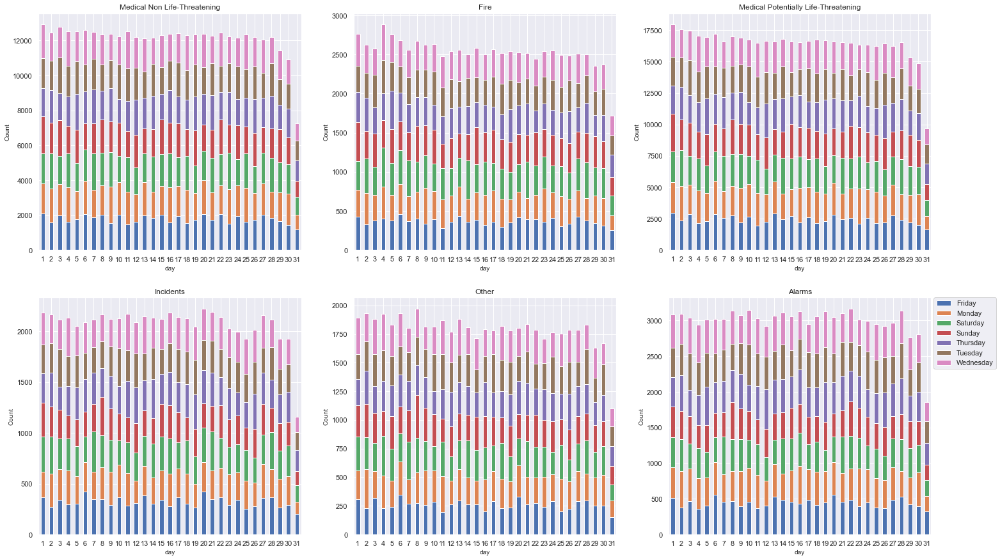

In [60]:
fig = plt.figure(figsize=(25,15))
for i,nom in enumerate(df4["Call Category"].unique(), 0):  
    data_req = df4[(df4['Call Category'] == nom)].groupby(['day', 'weekday']).size().unstack(level=1)
    ax = fig.add_subplot(2, 3, i+1)
    data_req.plot(kind='bar', stacked=True, ax=ax)
    plt.title(nom)
    plt.xlabel('day', fontsize=10)
    plt.xticks(rotation=1)
    #plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
    plt.ylabel('Count', fontsize=10)
    ax.get_legend().remove()
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

**Barplots de chaque Call Category par jour de la semaine**

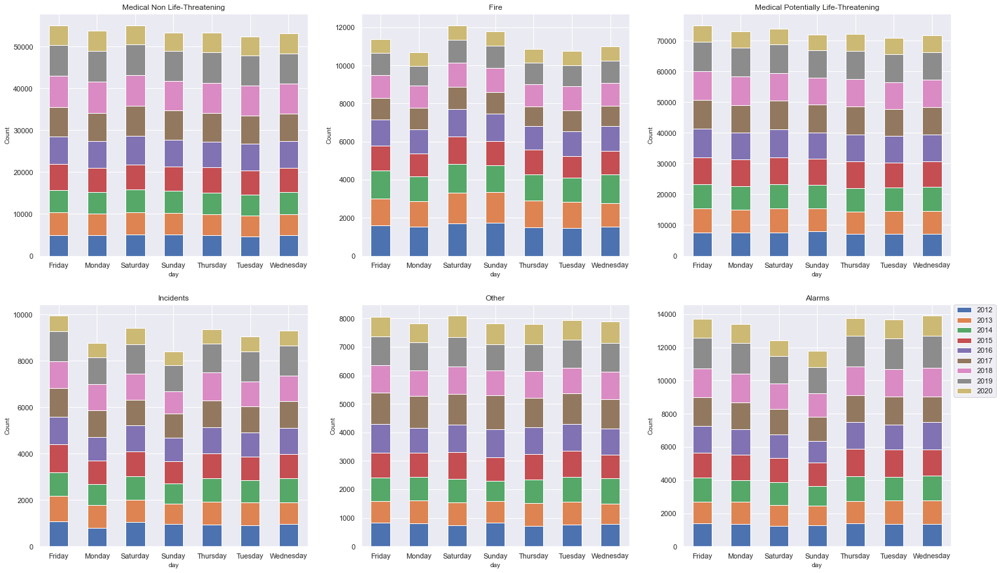

In [61]:
fig = plt.figure(figsize=(25,15))
for i,nom in enumerate(df4["Call Category"].unique(), 0):  
    data_req = df4[(df4['Call Category'] == nom)].groupby(['weekday', 'year']).size().unstack(level=1)
    ax = fig.add_subplot(2, 3, i+1)
    data_req.plot(kind='bar', stacked=True, ax=ax)
    plt.title(nom)
    plt.xlabel('day', fontsize=10)
    plt.xticks(rotation=1)
    #plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
    plt.ylabel('Count', fontsize=10)
    ax.get_legend().remove()
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

**Lineplots de chaque Call Category par heure**

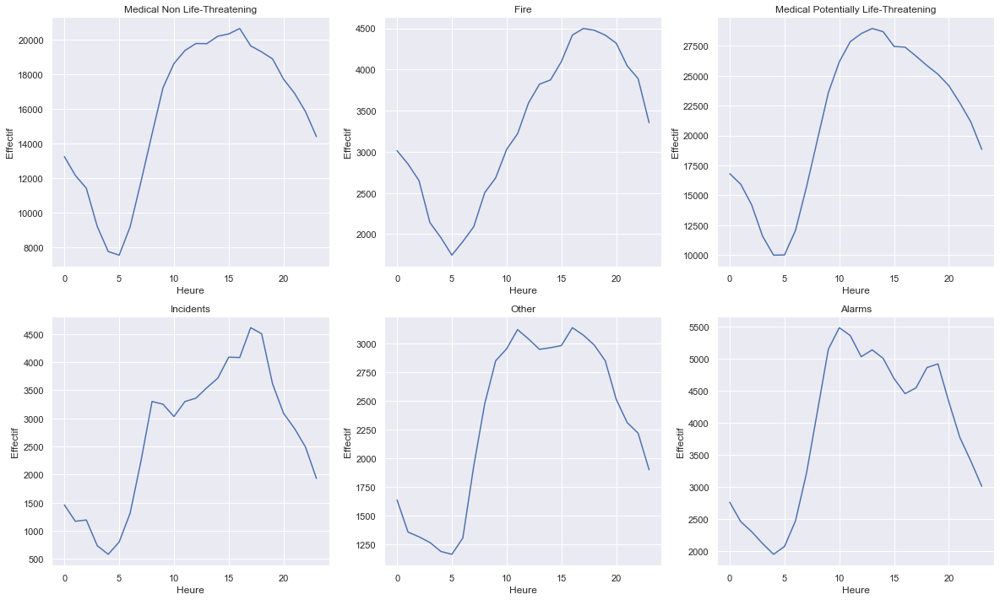

In [62]:
fig = plt.figure(figsize=(20,25))
for i,nom in enumerate(df4["Call Category"].unique(), 0):
    datamed = donnees2(nom)
    ra = pd.DataFrame(datamed["hour"].value_counts())
    ra["Heure"] = ra.index
    ra.columns = ["Effectif", "Heure"]
    ax = fig.add_subplot(4, 3, i+1)
    sns.lineplot(data = ra, x = "Heure", y = "Effectif", ax = ax, legend="full")    
    ax.set_title(nom)

**Barplots de chaque Call Category par heure**

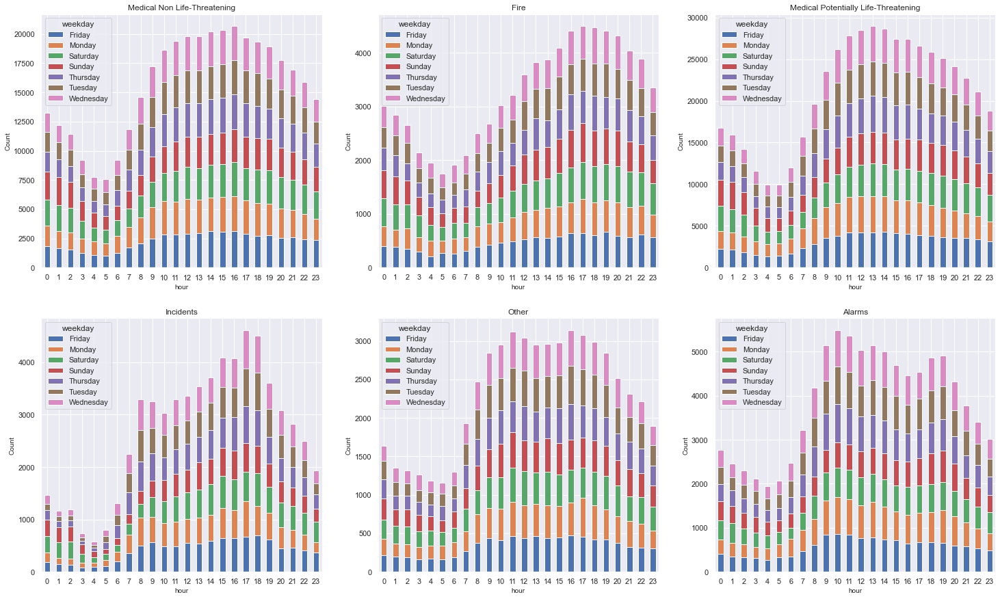

In [63]:
fig = plt.figure(figsize=(25,15))
for i,nom in enumerate(df4["Call Category"].unique(), 0):  
    data_req = df4[(df4['Call Category'] == nom)].groupby(['hour', 'weekday']).size().unstack(level=1)
    ax = fig.add_subplot(2, 3, i+1)
    data_req.plot(kind='bar', stacked=True, ax=ax)
    plt.title(nom)
    plt.xlabel('hour', fontsize=10)
    plt.xticks(rotation=1)
    #plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
    plt.ylabel('Count', fontsize=10)
    #ax.get_legend().remove()
#plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

**Barplots des appels par mois et pour chaque année**

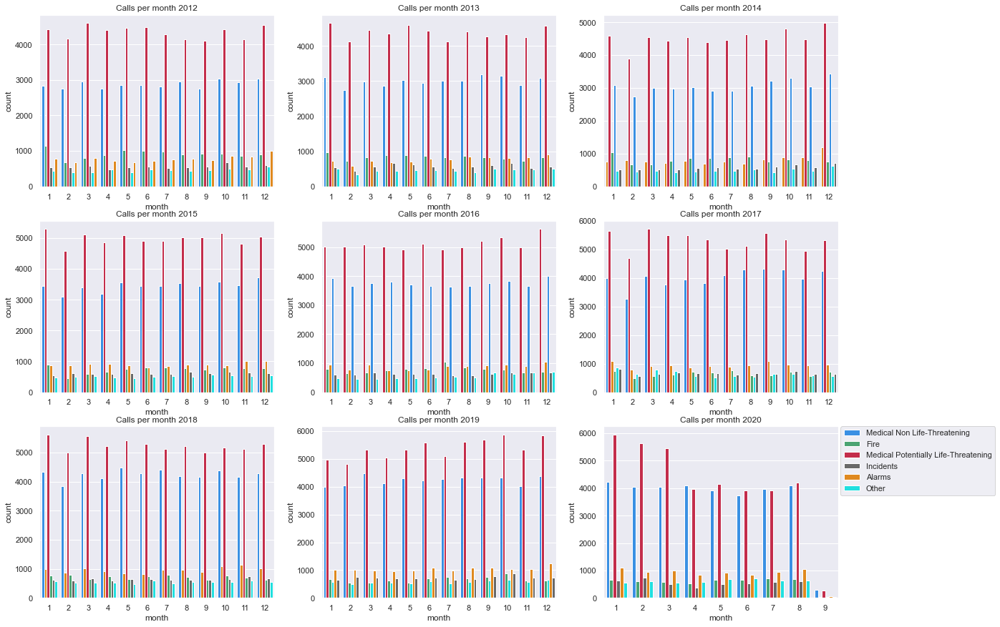

In [64]:
palette ={"Medical Potentially Life-Threatening": "crimson", "Medical Non Life-Threatening": "dodgerblue", "Fire": "mediumseagreen", "Alarms": "darkorange", "Other": "aqua", "Incidents": "dimgrey"}

fig = plt.figure(figsize=(20,15))
for i in range(0,9):
    ax = fig.add_subplot(3, 3, i+1)
    sns.countplot(x='month', hue='Call Category', palette=palette, data=df4.loc[df4['year']==2012+i,:], ax=ax)
    ax.set_title('Calls per month '+str(2012+i))
    ax.get_legend().remove()
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

# 2.2. Visualisation des données géographiques

**Nombre d'appels par quartier**

In [65]:
df4["Neighborhooods - Analysis Boundaries"].unique().shape

(41,)

In [66]:
# Pourcentage des incidents par quartier
df4["Neighborhooods - Analysis Boundaries"].value_counts(normalize=True) * 100

Tenderloin                        14.442511
South of Market                   10.942185
Mission                            9.502731
Financial District/South Beach     6.857692
Bayview Hunters Point              5.140994
Sunset/Parkside                    3.724247
Western Addition                   3.537490
Nob Hill                           3.156153
Castro/Upper Market                2.657200
Hayes Valley                       2.559144
Outer Richmond                     2.409211
West of Twin Peaks                 2.119892
North Beach                        2.032296
Excelsior                          1.996153
Chinatown                          1.929648
Pacific Heights                    1.862889
Marina                             1.819091
Potrero Hill                       1.716868
Bernal Heights                     1.670519
Haight Ashbury                     1.588707
Inner Sunset                       1.449575
Mission Bay                        1.443112
Lakeshore                       

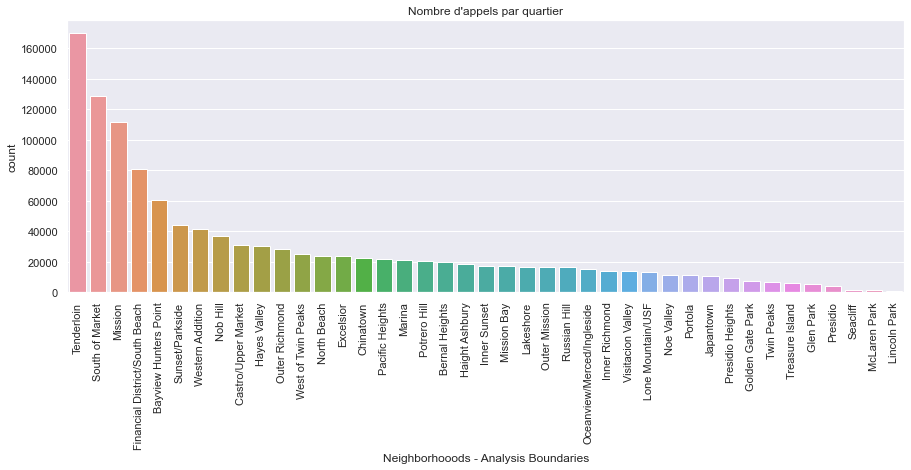

In [67]:
plt.figure(figsize=(15,5))
sns.countplot(x='Neighborhooods - Analysis Boundaries', data=df4, 
              order = df4['Neighborhooods - Analysis Boundaries'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Nombre d'appels par quartier")
plt.show()

**Nombre d'appels par catégorie à Tenderloin (le quartier où il y a le plus d'appels)**

Text(0, 0.5, 'Count')

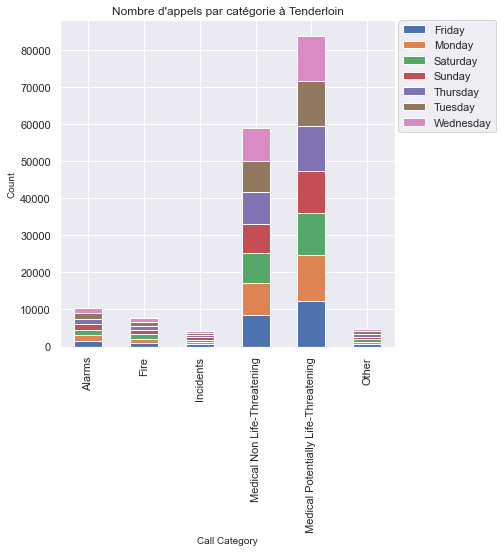

In [68]:
data_req = df4[(df4['Neighborhooods - Analysis Boundaries'] == 'Tenderloin')].groupby(['Call Category', 'weekday']).size().unstack(level=1)
data_req.plot(kind='bar', stacked=True, figsize=(6,6))
plt.title("Nombre d'appels par catégorie à Tenderloin")
plt.xlabel('Call Category', fontsize=10)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
plt.ylabel('Count', fontsize=10)

**Nombre d'appels par catégorie à Lincoln Park (le quartier où il y a le moins d'appels)**

Text(0, 0.5, 'Count')

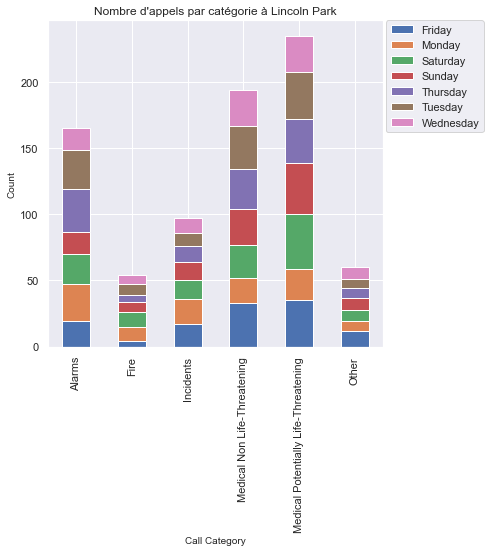

In [69]:
data_req = df4[(df4['Neighborhooods - Analysis Boundaries'] == 'Lincoln Park')].groupby(['Call Category', 'weekday']).size().unstack(level=1)
data_req.plot(kind='bar', stacked=True, figsize=(6,6))
plt.title("Nombre d'appels par catégorie à Lincoln Park")
plt.xlabel('Call Category', fontsize=10)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
plt.ylabel('Count', fontsize=10)

**Visualisation des données par des cartes géographiques**

In [70]:
!pip install folium
import folium

**Visaluation des nombres d'appels par quartier de San Francisco**

In [72]:
sf = df4.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [73]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Appels à San Francisco, par quartier')

# display the map
sf_map

C:\Users\Allard\anaconda3\envs\geopandas\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


**Visaluation des nombre d'appels de la catégorie Fire**

In [74]:
df4_fire=df4.loc[df4['Call Category']=='Fire']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [75]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Fire à San Francisco, par quartier')

# display the map
sf_map

**Visaluation des nombre d'appels de la catégorie Other**

In [76]:
df4['Call Category'].unique()

array(['Medical Non Life-Threatening', 'Fire',
       'Medical Potentially Life-Threatening', 'Incidents', 'Other',
       'Alarms'], dtype=object)

In [77]:
df4_fire=df4.loc[df4['Call Category']=='Other']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [78]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Other à San Francisco, par quartier')

# display the map
sf_map

**Visaluation des nombre d'appels de la catégorie Medical Non Life-Threatening**

In [79]:
df4['Call Category'].unique()

array(['Medical Non Life-Threatening', 'Fire',
       'Medical Potentially Life-Threatening', 'Incidents', 'Other',
       'Alarms'], dtype=object)

In [80]:
df4_fire=df4.loc[df4['Call Category']=='Medical Non Life-Threatening']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [81]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Medical Non Life-Threatening à San Francisco, par quartier')

# display the map
sf_map

**Visaluation des nombre d'appels de la catégorie Medical Potentially Life-Threatening**

In [82]:
df4_fire=df4.loc[df4['Call Category']=='Medical Potentially Life-Threatening']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [83]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Medical Potentially Life-Threatening à San Francisco, par quartier')

# display the map
sf_map

**Visaluation des nombre d'appels de la catégorie Incidents**

In [84]:
df4_fire=df4.loc[df4['Call Category']=='Incidents']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [85]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Incidents à San Francisco, par quartier')

# display the map
sf_map

**Visaluation des nombre d'appels de la catégorie Alarms**

In [86]:
df4_fire=df4.loc[df4['Call Category']=='Alarms']
sf = df4_fire.groupby('Neighborhooods - Analysis Boundaries').count()
sf = pd.DataFrame(sf,columns=['Call Category'])  # remove unneeded columns
sf.reset_index(inplace=True)   # default index, otherwise groupby column becomes index
sf.rename(columns={'Neighborhooods - Analysis Boundaries':'Neighborhood','Call Category':'Count'}, inplace=True)
sf.sort_values(by='Count', inplace=True, ascending=False)

In [87]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42
sf_neighborhood_geo = 'Analysis Neighborhoods.geojson'

# Create map
sf_map = folium.Map(
       location=[latitude,longitude],
       zoom_start=12)

 
# Use json file  TEST based on class
sf_map.choropleth(
       geo_data=sf_neighborhood_geo,
       data=sf,
       columns=['Neighborhood','Count'],
       key_on='feature.properties.nhood',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Urgences Alarms à San Francisco, par quartier')

# display the map
sf_map